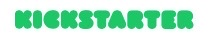

Introduction to Kickstarter 

Kickstarter is an American public benefit corporation based in New York, that maintains a global crowdfunding platform focused on creativity.
The company's stated mission is to "help bring creative projects to life". As of December 2019, Kickstarter has received more than $4.6 billion in pledges from 17.2 million backers to fund 445,000 projects, such as films, music, stage shows, comics, journalism, video games, technology, publishing, and food-related projects.

People who back Kickstarter projects are offered tangible rewards or experiences in exchange for their pledges. This model traces its roots to subscription model of arts patronage, where artists would go directly to their audiences to fund their work.


This dataset includes kickstarter data from 2009 - 2019 with over 200.000 projects and 37 attributes.

The attributes/features are:

* backers_count: amount/number of different investors
* blurb: short summary of the product/idea
* category: composition of various data/subcategories regarding product on website (web-url, name, position, id, ...)
* converted_pledged_amount: Amounts paid to creator (project owner)
* country: country of origin of the project
* created_at: UNIX Timestamp from 1970 (2009 bis 2019) 
* creator: creator of kickstarter campaign plus more subcategories (e.g. id, nickname, profile, links, ...)
* currency: local currency of project
* currency_symbol 
* currency_trailing_code
* current_currency 
* deadline: when project will end
* disable_communication
* friends
* fx_rate: exchange rate 
* goal: target amount of money you want to get from investors
* id: Project number
* is_backing
* is_starrable
* is_starred
* launched_at: time the project is launched (timestamp)
* location: city or town of origin 
* name: name of the product/project
* permissions
* photo
* pledged: amount of money in local currency offered from investors 
* profile: profile information plus many subdata 
* slug 
* source_url
* spotlight: attention to products and history (marketing) 
* staff_pick: are positive voted by staff members of kickstart
* state: state of project development (successfull, failed, live, cancelled, suspended)
* state_changed_at
* static_usd_rate
* urls
* usd_pledged: pledged amounts converted in USD
* usd_type

EDA process:

Target of this project:

Making correct prediction if campaign will be sucessful or not by use of three different machine learning algorithms. A campaign is successful when the collected amount (=pledged) is the same or greater than the requested amount ( = goal).

Questions:

- Which features are important for a successful campaign?

- What kind of campaigns can be recommended to backers?

- What can be helpful for creator to make a campaign successful?

- Requested Money for Campaign (Goal) relevant for success?

                                                         


In [273]:
# Import of relevant packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors
import seaborn as sns
from datetime import datetime

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import cross_val_predict, cross_val_score, cross_validate
from sklearn.metrics import roc_curve, confusion_matrix, accuracy_score, recall_score, precision_score

from sklearn.linear_model import LogisticRegression

In [274]:
RSEED = 42

In [275]:
def prepForModel(df):
    drop_cols = [
        'blurb',
        'creator',
        'currency',
        'currency_trailing_code',
        'fx_rate',
        'location',
        'name',
        'profile',
        'slug',
        'source_url',
        'static_usd_rate',
        'usd_type',
        'spotlight'
    ]
    df.drop(drop_cols, inplace=True, axis = 1)
    for c in df.columns: 
        if df[c].dtype == "object": 
            df[c] = df[c].astype("category") 
    df.dropna(inplace=True)
    return df

In [276]:
#26958 duplicates(id) were dropped

In [277]:
df = pd.read_csv('data/df_clean.csv')
df.drop(df.columns[df.columns.str.contains('unnamed',case = False)],axis = 1, inplace = True)
df = df[(df['state']=='failed') | (df['state']=='successful')]
df.head()

,backers_count,blurb,converted_pledged_amount,country,created_at,creator,currency,currency_trailing_code,deadline,disable_communication,...,spotlight,staff_pick,state,state_changed_at,static_usd_rate,usd_pledged,usd_type,category_name,category_slug,cgrouped
0,2,Sreap aims to be the news article platform of ...,2,CA,1540305218,"{""id"":1378912800,""name"":""Jack Rayner"",""is_regi...",CAD,True,1542900780,False,...,False,False,failed,1542900780,0.76388,2.513164,international,Web,journalism/web,CA
1,2,A short film drama about family and life on th...,2,US,1462569183,"{""id"":619766856,""name"":""Stephan Denash Giacoma...",USD,True,1471994797,False,...,False,False,failed,1471994797,1.00000,2.000000,international,Drama,film & video/drama,US
2,119,We're establishing permanent home for our deli...,5635,US,1483369959,"{""id"":1692472044,""name"":""Katie Startzman"",""slu...",USD,True,1487595600,False,...,True,False,successful,1487595600,1.00000,5635.000000,international,Restaurants,food/restaurants,US
3,70,Honoring the abandoned house on John St with a...,1317,US,1325637522,"{""id"":268837772,""name"":""Patrick Steele"",""is_re...",USD,True,1331530353,False,...,True,False,successful,1331530353,1.00000,1317.690000,international,Graphic Design,design/graphic design,US
4,73,Send Austin's youth slam team to Nationals in ...,5134,US,1301344770,"{""id"":1873668274,""name"":""Sky Candy"",""slug"":""sk...",USD,True,1306558117,False,...,True,False,successful,1306558117,1.00000,5134.010000,international,Poetry,publishing/poetry,US


In [278]:
# Conversion of goal in local currencies to goal in USD:
df['Goal_USD'] = df['goal'] * df['fx_rate']
df.Goal_USD[0]

22447.747199999998

In [279]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 173168 entries, 0 to 187659
Data columns (total 31 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   backers_count             173168 non-null  int64  
 1   blurb                     173168 non-null  object 
 2   converted_pledged_amount  173168 non-null  int64  
 3   country                   173168 non-null  object 
 4   created_at                173168 non-null  int64  
 5   creator                   173168 non-null  object 
 6   currency                  173168 non-null  object 
 7   currency_trailing_code    173168 non-null  bool   
 8   deadline                  173168 non-null  int64  
 9   disable_communication     173168 non-null  bool   
 10  fx_rate                   173168 non-null  float64
 11  goal                      173168 non-null  float64
 12  is_starrable              173168 non-null  bool   
 13  launched_at               173168 non-null  i

In [280]:
df = prepForModel(df)

In [281]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 173168 entries, 0 to 187659
Data columns (total 18 columns):
 #   Column                    Non-Null Count   Dtype   
---  ------                    --------------   -----   
 0   backers_count             173168 non-null  int64   
 1   converted_pledged_amount  173168 non-null  int64   
 2   country                   173168 non-null  category
 3   created_at                173168 non-null  int64   
 4   deadline                  173168 non-null  int64   
 5   disable_communication     173168 non-null  bool    
 6   goal                      173168 non-null  float64 
 7   is_starrable              173168 non-null  bool    
 8   launched_at               173168 non-null  int64   
 9   pledged                   173168 non-null  float64 
 10  staff_pick                173168 non-null  bool    
 11  state                     173168 non-null  category
 12  state_changed_at          173168 non-null  int64   
 13  usd_pledged               173

In [282]:
#basic statistic:
df.describe()

,backers_count,converted_pledged_amount,created_at,deadline,goal,launched_at,pledged,state_changed_at,usd_pledged,Goal_USD
count,173168.000000,1.731680e+05,1.731680e+05,1.731680e+05,1.731680e+05,1.731680e+05,1.731680e+05,1.731680e+05,1.731680e+05,1.731680e+05
mean,152.393208,1.349460e+04,1.453141e+09,1.460049e+09,4.522131e+04,1.457253e+09,1.942241e+04,1.460049e+09,1.350689e+04,3.753430e+04
std,904.377017,8.884642e+04,6.228775e+07,6.188066e+07,1.110152e+06,6.193751e+07,3.239909e+05,6.188069e+07,8.892836e+04,1.056215e+06
min,0.000000,0.000000e+00,1.240366e+09,1.242468e+09,1.000000e-02,1.240920e+09,0.000000e+00,1.242468e+09,0.000000e+00,1.000000e-02
25%,4.000000,1.480000e+02,1.411615e+09,1.418630e+09,1.500000e+03,1.415835e+09,1.500000e+02,1.418630e+09,1.490356e+02,1.500000e+03
50%,30.000000,1.766000e+03,1.455401e+09,1.462124e+09,5.000000e+03,1.459333e+09,1.797000e+03,1.462124e+09,1.769000e+03,4.950000e+03
75%,94.000000,7.083250e+03,1.507243e+09,1.514001e+09,1.500000e+04,1.511201e+09,7.470000e+03,1.514001e+09,7.092250e+03,1.200000e+04
max,105857.000000,6.333295e+06,1.551738e+09,1.552536e+09,1.000000e+08,1.551849e+09,8.103074e+07,1.552536e+09,6.333296e+06,1.325680e+08


Findings:
- converted_pledged_amount differs extrem from min to max but also from the 75% quartile to max --> Outlier?
- 

In [283]:
#Searching for reasons why a project failed:
df_f = df.query('converted_pledged_amount == 0 and state == "failed"')

<__array_function__ internals>:5: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:5: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:5: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:5: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:5: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:5: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


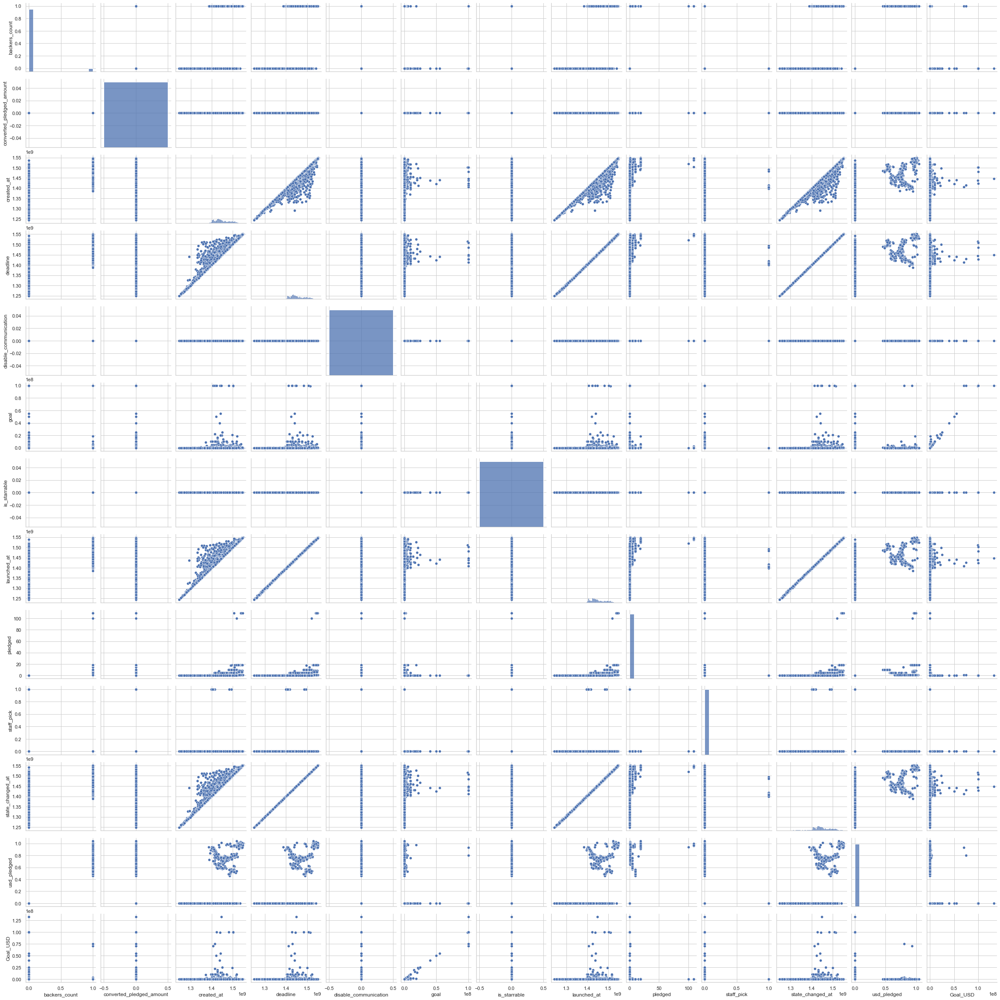

In [284]:
sns.pairplot(data = df_f);

In [285]:
df = df.loc[df['state'].isin(
            ['successful', 'failed'])]

In [286]:
df.state

0             failed
1             failed
2         successful
3         successful
4         successful
             ...    
187655    successful
187656        failed
187657        failed
187658        failed
187659        failed
Name: state, Length: 173168, dtype: category
Categories (2, object): ['failed', 'successful']

In [287]:
df.pledged[10]
df.country[10]

'NO'

In [288]:
df.usd_pledged[10]

48.49781715

In [289]:
# Drop rows with state categories live, canceled & suspended
# (just for fun)
df_fun = df[(df['state']=='failed') | (df['state']=='successful')]
df_fun.state.unique()
df = df_fun


In [290]:
df.category_name.unique()

['Web', 'Drama', 'Restaurants', 'Graphic Design', 'Poetry', ..., 'Animals', 'Typography', 'Games', 'Embroidery', 'Taxidermy']
Length: 159
Categories (159, object): ['Web', 'Drama', 'Restaurants', 'Graphic Design', ..., 'Typography', 'Games', 'Embroidery', 'Taxidermy']

In [291]:
#Top 10 Sub-categories
n = 10
df_top_cat = df['category_name'].value_counts()[:n].index.tolist()
df_top_cat

['Web',
 'Product Design',
 'Tabletop Games',
 'Accessories',
 'Comic Books',
 'Comedy',
 'Illustration',
 'Gadgets',
 'Apparel',
 'Graphic Novels']

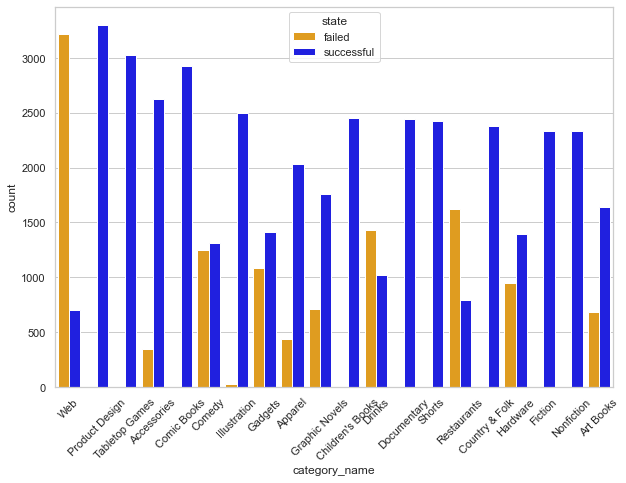

In [292]:
#Top Sub-categories

plt.subplots(figsize=(10, 7), sharex=True)

sns.countplot(data = df, x="category_name", hue="state", order=df.category_name.value_counts().iloc[:20].index, palette={"failed": "orange", "successful": "blue", "canceled": "white", "live":"white", "suspended":"white"});
#legend_labels, _= ax.get_legend_handles_labels()
#ax.legend(legend_labels, ['successful', 'failed'], 
        # bbox_to_anchor=(1,1), 
         # title='state')
plt.xticks(rotation=45);


The top 20 sub-categories are plotted above. Interesting is the high number of failed campaigns especially for Web, Comedy, Gadgetes and Graphic Novels. Campaigns in Product Desgin, Tabletop Games, Comic Books have only successful campaigns.
Similar findings for other categories.

In [293]:
#Top slug_categories
n = 10
df_top_slug = df['category_slug'].value_counts()[:n].index.tolist()
df_top_slug

['design/product design',
 'games/tabletop games',
 'fashion/accessories',
 'comics/comic books',
 'art/illustration',
 'technology/gadgets',
 'fashion/apparel',
 'comics/graphic novels',
 "publishing/children's books",
 'food/drinks']

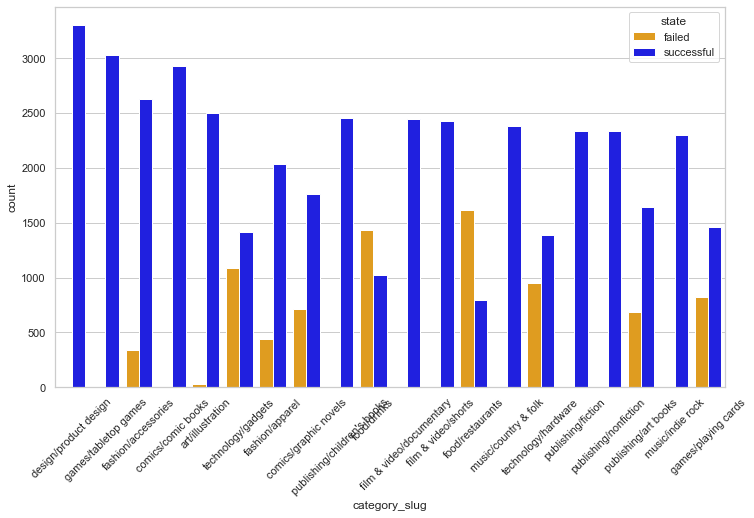

In [294]:
# Check if categories are saying anything about the success/fail:
plt.subplots(figsize=(12, 7), sharex=True)

sns.countplot(data = df, x="category_slug", hue="state", order=df.category_slug.value_counts().iloc[:20].index, palette={"failed": "orange", "successful": "blue", "canceled": "white", "live":"white", "suspended":"white"});
#legend_labels, _= ax.get_legend_handles_labels()
#ax.set_label('Label via method')
#ax.legend(legend_labels,['successful', 'failed'],
          #title='state')
plt.xticks(rotation=45);



/Users/birte/neuefische1/project-kickstarter/.venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


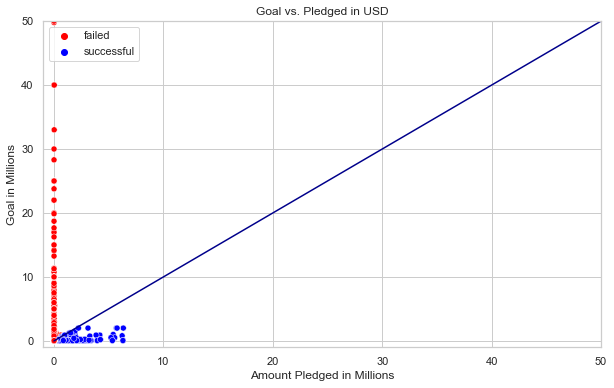

In [295]:
#overview of requested money and pledged amount:
fig, ax = plt.subplots(figsize=(10, 6))
#define colors 
ax.colors = ('orange', 'blue')
#create a plot using seaborn, adjust data to millions
sns.scatterplot(df.usd_pledged/1e6, df.Goal_USD/1e6, hue=df.state, ax=ax, palette={"failed": "red", "successful": "blue", "canceled": "white", "live":"white", "suspended":"white"} )#palette=ax.colors
#add blue line to better visualize the border between failed and successful projects
sns.lineplot(x=(0,50), y=(0,50), color='darkblue')
#set the axes from -1 to their maximum (-1 looks better than 0 actually)
ax.set(ylim=(-1,50), xlim=(-1,50))
#handles, labels = ax.get_legend_handles_labels()
#ax.legend(legend_labels,['successful', 'failed'],title='state')
#set labels and title
ax.set(xlabel='Amount Pledged in Millions', ylabel='Goal in Millions', title= 'Goal vs. Pledged in USD')

#sns.despine(right = True)
plt.show()

Successful projects are mostly under a certain amount of requested money. The failed projects did not collect any money or a very small amount of money.

/Users/birte/neuefische1/project-kickstarter/.venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


[Text(0.5, 0, 'Amount Pledged in Millions'),
 Text(0, 0.5, 'Goal in Millions'),
 Text(0.5, 1.0, 'Goal vs. Pledged')]

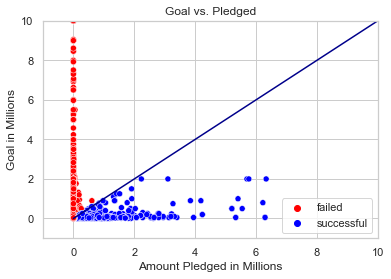

In [296]:
#same as above but with changed ranges for both axis with a range from 0 to 10 Millions:
#define colors 
colors = ('orange','darkblue')
#create a plot using seaborn, adjust data to millions
ax = sns.scatterplot(df.usd_pledged/1e6, df.Goal_USD/1e6, hue=df.state, palette={"failed": "red", "successful": "blue", "canceled": "white", "live":"white", "suspended":"white"})
#add blue line to better visualize the border between failed and successful projects
sns.lineplot(x=(0,50), y=(0,50), color='darkblue')
#set the axes from -1 to their maximum (-1 looks better than 0 actually)
ax.set(ylim=(-1,10), xlim=(-1,10))
#set labels and title
ax.set(xlabel='Amount Pledged in Millions', ylabel='Goal in Millions', title= 'Goal vs. Pledged')

In [297]:
#sns.histplot(data=df, x="usd_pledged", y="Goal_USD", binwidth=0.05, hue="state")

In [298]:
# Highest amount pledged:
df['usd_pledged'].nlargest(20)

109180    6.333296e+06
133012    6.297405e+06
182193    6.297405e+06
32102     6.225355e+06
138414    5.764229e+06
19791     5.702153e+06
24001     5.545992e+06
23730     5.408917e+06
72789     5.333793e+06
159513    5.333793e+06
7305      5.206612e+06
119768    5.206612e+06
121630    4.236618e+06
154055    4.236618e+06
14709     4.188927e+06
13798     3.948547e+06
127834    3.948547e+06
49620     3.845171e+06
136029    3.401361e+06
151728    3.317658e+06
Name: usd_pledged, dtype: float64

<AxesSubplot:ylabel='Goal_USD'>

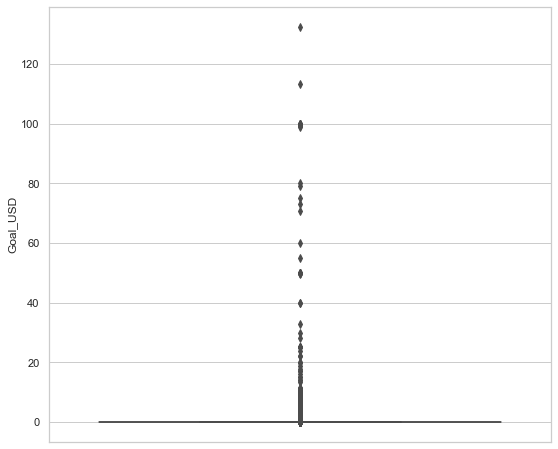

In [299]:
#Boxplot for Goal in USD
plt.figure(figsize=(9, 8))
sns.boxplot(y = df.Goal_USD/1e6)

In [300]:
#Convert all Goal amounts to USD for comparison
#combine goal with successful?
#Highest Goal amounts asked for 
df['goal'].nlargest(20)

14368     100000000.0
31003     100000000.0
42007     100000000.0
51101     100000000.0
56007     100000000.0
63788     100000000.0
72772     100000000.0
87697     100000000.0
101285    100000000.0
105029    100000000.0
112817    100000000.0
119775    100000000.0
130001    100000000.0
62853      99000000.0
117029     80000000.0
98403      73000000.0
117727     70000000.0
86012      68000000.0
140806     60000000.0
57403      55000000.0
Name: goal, dtype: float64

In [301]:

df.sort_values(['goal', 'state'], ascending=False).groupby('state').head(5)

,backers_count,converted_pledged_amount,country,created_at,deadline,disable_communication,goal,is_starrable,launched_at,pledged,staff_pick,state,state_changed_at,usd_pledged,category_name,category_slug,cgrouped,Goal_USD
14368,3,28,SE,1498824040,1504456195,False,100000000.0,False,1499272195,227.0,False,failed,1504456199,26.754190,Drama,film & video/drama,Europe,1.074743e+07
31003,0,0,CH,1438432828,1444065130,False,100000000.0,False,1438881130,0.0,False,failed,1444065130,0.000000,Restaurants,food/restaurants,Europe,9.924642e+07
42007,1,0,AU,1406946130,1412701539,False,100000000.0,False,1407517539,1.0,False,failed,1412701539,0.928942,Space Exploration,technology/space exploration,Other,7.066399e+07
51101,0,0,US,1481257322,1484357054,False,100000000.0,False,1481765054,0.0,False,failed,1484357054,0.000000,Fantasy,film & video/fantasy,US,1.000000e+08
56007,1,20,US,1431272360,1435451499,False,100000000.0,False,1431563499,20.0,False,failed,1435451502,20.000000,Live Games,games/live games,US,1.000000e+08
86012,12613,743538,JP,1513564265,1525478400,False,68000000.0,False,1522083720,81030744.0,True,successful,1525478401,773674.250900,Video Games,games/video games,Asia,6.096996e+05
10054,1705,210046,JP,1530788869,1539995110,False,16665000.0,False,1537403110,23606140.0,False,successful,1539995110,210873.884700,Video Games,games/video games,Asia,1.494212e+05
112522,1705,210046,JP,1530788869,1539995110,False,16665000.0,False,1537403110,23606140.0,False,successful,1539995110,210873.884681,Video Games,games/video games,Asia,1.494212e+05
9211,1928,210922,JP,1524199454,1529247600,False,15000000.0,False,1526676458,23343872.0,True,successful,1529247600,211798.016901,Animation,film & video/animation,Asia,1.348314e+05
19353,1928,210922,JP,1524199454,1529247600,False,15000000.0,False,1526676458,23343872.0,True,successful,1529247600,211798.016901,Animation,film & video/animation,Asia,1.348314e+05


/Users/birte/neuefische1/project-kickstarter/.venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


[Text(0.5, 0, 'Amount Pledged in Millions'),
 Text(0, 0.5, 'Goal in Millions'),
 Text(0.5, 1.0, 'Goal vs. Pledged')]

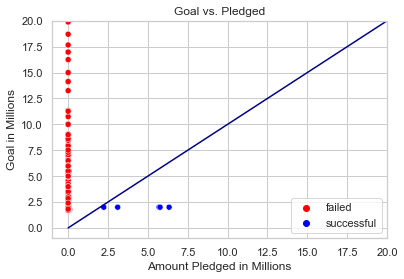

In [302]:
#define colors (darkgreen for successful projects and darkred for failed ones
colors = ('orange','darkblue')
#create a plot using seaborn, adjust data to millions
ax = sns.scatterplot(df.usd_pledged/1e6, df.Goal_USD.nlargest(280)/1e6, hue=df.state, palette={"failed": "red", "successful": "blue", "canceled": "white", "live":"white", "suspended":"white"})
#add blue line to better visualize the border between failed and successful projects
sns.lineplot(x=(0,50), y=(0,50), color='darkblue')
#set the axes from -1 to their maximum (-1 looks better than 0 actually)
ax.set(ylim=(-1,20), xlim=(-1,20))
#set labels and title
ax.set(xlabel='Amount Pledged in Millions', ylabel='Goal in Millions', title= 'Goal vs. Pledged')

In [303]:
#lowest Goal amounts asked for 
df['goal'].nsmallest(20)

159808    0.01
226       1.00
526       1.00
1592      1.00
1644      1.00
2021      1.00
2507      1.00
2872      1.00
3065      1.00
3309      1.00
3594      1.00
4685      1.00
5613      1.00
5967      1.00
6066      1.00
6823      1.00
7025      1.00
8045      1.00
8330      1.00
8435      1.00
Name: goal, dtype: float64

/Users/birte/neuefische1/project-kickstarter/.venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


[Text(0.5, 0, 'Amount Pledged in Millions'),
 Text(0, 0.5, 'Goal in Millions'),
 Text(0.5, 1.0, 'Goal vs. Pledged')]

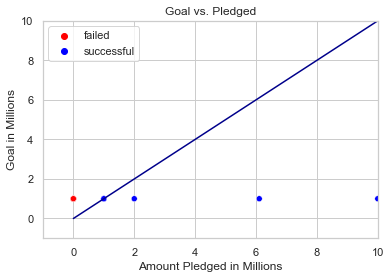

In [304]:
#define colors (darkgreen for successful projects and darkred for failed ones
colors = ('orange','darkblue')
#create a plot using seaborn, adjust data to millions
ax = sns.scatterplot(df.usd_pledged, df.goal.nsmallest(50), hue=df.state,  palette={"failed": "red", "successful": "blue", "canceled": "white", "live":"white", "suspended":"white"} )
#add blue line to better visualize the border between failed and successful projects
sns.lineplot(x=(0,50), y=(0,50), color='darkblue')
#set the axes from -1 to their maximum (-1 looks better than 0 actually)
ax.set(ylim=(-1,10), xlim=(-1,10))
#set labels and title
ax.set(xlabel='Amount Pledged in Millions', ylabel='Goal in Millions', title= 'Goal vs. Pledged')

[Text(0.5, 0, 'Number of Backers'),
 Text(0, 0.5, 'USD Pledged in Million'),
 Text(0.5, 1.0, 'Backer vs Pledge')]

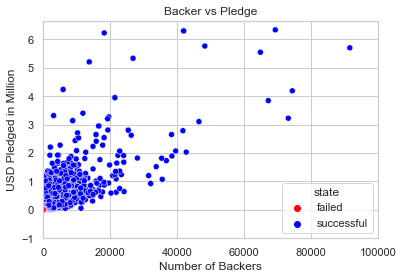

In [305]:
ax = sns.scatterplot(x=df.backers_count, y=df.usd_pledged/1e6, hue=df.state,  palette={"failed": "red", "successful": "blue", "canceled": "white", "live":"white", "suspended":"white"})
#we set the xlim to 100,000 backers to get a better overview
ax.set(ylim=(-1,None), xlim=(-1,100000))
#set labels and title
ax.set(xlabel='Number of Backers', ylabel='USD Pledged in Million', title= 'Backer vs Pledge')

There seems to be a clear correlation between number of backers and amount pledged in USD. 

<AxesSubplot:xlabel='backers_count', ylabel='usd_pledged'>

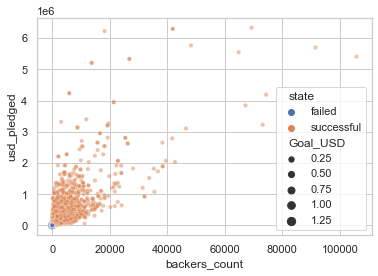

In [306]:
sns.scatterplot(data=df, x='backers_count', y='usd_pledged', 
                alpha=0.5, hue='state', size='Goal_USD')

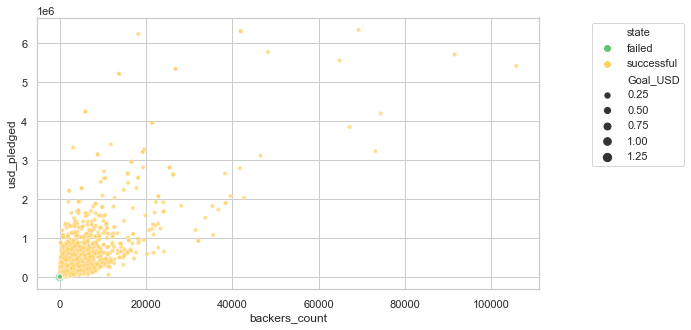

In [307]:
# Change default palette
sns.set_palette(['#62C370', '#FFD166', '#EF476F'])
# Plot
plt.figure(figsize=(9, 5))
sns.scatterplot(data=df, x='backers_count', y='usd_pledged', 
                alpha=0.7, hue='state', size='Goal_USD')
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1));

<AxesSubplot:xlabel='country', ylabel='backers_count'>

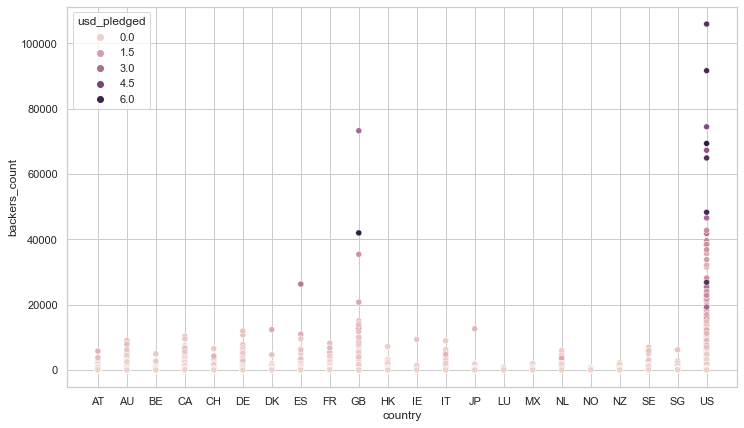

In [308]:
#Query number of backers per country
plt.subplots(figsize=(12, 7), sharex=True)
sns.scatterplot(data=df, x="country", y="backers_count", hue="usd_pledged")

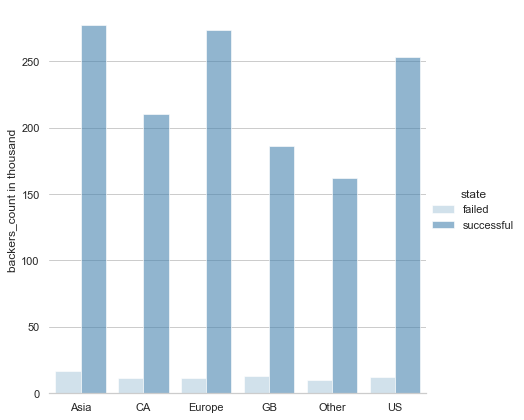

In [309]:
sns.set_theme(style="whitegrid")

# Draw a nested barplot by cgrouped and state
g = sns.catplot(
    data=df, kind="bar",
    x="cgrouped", y="backers_count", hue="state",
    ci=None, palette="Blues", alpha=.6, height=6
)
g.despine(left=True)
g.set_axis_labels("", "backers_count in thousand")
g.legend.set_title("state")

Most projects are located in the US but it seems that many backers come from outside the US. 

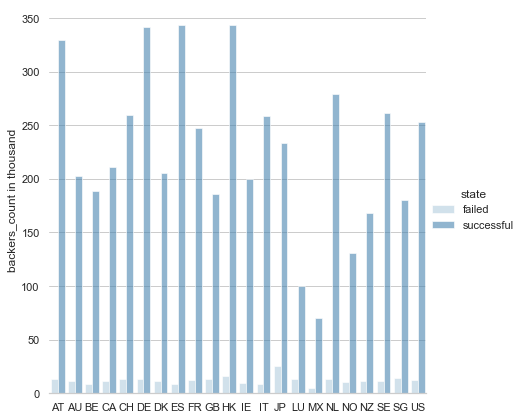

In [310]:
#Only to check if the above chart is right....
sns.set_theme(style="whitegrid")

# Draw a nested barplot by cgrouped and state
g = sns.catplot(
    data=df, kind="bar",
    x="country", y="backers_count", hue="state",
    ci=None, palette="Blues", alpha=.6, height=6
)
g.despine(left=True)
g.set_axis_labels("", "backers_count in thousand")
g.legend.set_title("state")

In [311]:
#<sns.histplot(df["backers_count"], binwidth=0.05)

In [312]:
df.query('state == "successful"').count()

backers_count               105535
converted_pledged_amount    105535
country                     105535
created_at                  105535
deadline                    105535
disable_communication       105535
goal                        105535
is_starrable                105535
launched_at                 105535
pledged                     105535
staff_pick                  105535
state                       105535
state_changed_at            105535
usd_pledged                 105535
category_name               105535
category_slug               105535
cgrouped                    105535
Goal_USD                    105535
dtype: int64

105.535 projects ended sucessfully.

In [313]:
#How many projects ended with pleged > Goal?
df.query('converted_pledged_amount > Goal_USD')

,backers_count,converted_pledged_amount,country,created_at,deadline,disable_communication,goal,is_starrable,launched_at,pledged,staff_pick,state,state_changed_at,usd_pledged,category_name,category_slug,cgrouped,Goal_USD
2,119,5635,US,1483369959,1487595600,False,4000.0,False,1486386355,5635.00,False,successful,1487595600,5635.000000,Restaurants,food/restaurants,US,4000.000000
3,70,1317,US,1325637522,1331530353,False,500.0,False,1329719553,1317.69,False,successful,1331530353,1317.690000,Graphic Design,design/graphic design,US,500.000000
4,73,5134,US,1301344770,1306558117,False,5000.0,False,1303102117,5134.01,False,successful,1306558117,5134.010000,Poetry,publishing/poetry,US,5000.000000
5,151,13268,US,1413254817,1416783493,False,12000.0,False,1414187893,13268.00,False,successful,1416783495,13268.000000,Restaurants,food/restaurants,US,12000.000000
6,79,1323,AU,1541843459,1550478074,False,550.0,False,1546158074,1850.32,False,successful,1550478074,1303.365334,Places,photography/places,Other,388.651928
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187650,51,2834,DE,1493850009,1499676435,False,2000.0,False,1496220435,2485.00,False,successful,1499676435,2764.708295,Graphic Design,design/graphic design,Europe,2264.182560
187652,71,738,US,1529697074,1532575863,False,600.0,False,1530415863,738.00,False,successful,1532575864,738.000000,Accessories,fashion/accessories,US,600.000000
187653,149,15661,US,1515534417,1528637731,False,15000.0,False,1525959331,15661.00,False,successful,1528637733,15661.000000,Country & Folk,music/country & folk,US,15000.000000
187654,106,5010,CA,1389291769,1392497003,False,5000.0,False,1389905003,5500.00,False,successful,1392497006,5018.559535,Mixed Media,art/mixed media,CA,3741.291200


From over 200 000 projects in total ended 105.535 successfully and for 102.092 of them were the final amount (pledged) higher than the Goal.

In [314]:

#plt.subplot(1, 2, 1)
#sns.countplot(x='backers_count', data=df)
#plt.subplot(1, 2, 2)
#sns.countplot(x='Goal_USD', data=df)

In [315]:
#plt.figure(figsize=(12,5))
#LogMin, LogMax = np.log10(df['delta_change_launch'].min()+1.),np.log10(df['delta_change_launch'].max())
#newBins = np.logspace(LogMin, LogMax,20)
#sns.histplot(data=df, x='backers_count', hue='state', bin=bin)#, bins=newBins, palette={"failed": "red", "successful": "green"}
#plt()

In [316]:
#staff pick zu usd_pledged
#ax = sns.scatterplot(x=df.staff_pick, y=df.usd_pledged/1e6, hue=df.state, palette=colors)
#we set the xlim to 100,000 backers to get a better overview
#ax.set(ylim=(-1,None), xlim=(-1,100000))
#set labels and title
#ax.set(xlabel='Number of Backers', ylabel='USD Pledged in Million', title= 'Backer vs Pledge')

In [317]:
#plt.figure(figsize=(12,5))
#LogMin, LogMax = np.log10(df['delta_change_launch'].min()+1.),np.log10(df['delta_change_launch'].max())
#newBins = np.logspace(LogMin, LogMax,20)
#sns.histplot(data=df, x='Goal_USD', hue='state', palette={"failed": "red", "successful": "blue", "canceled": "white", "live":"white", "suspended":"white"})
#plt()

## Conclusion EDA

In [318]:
#Dropped Columns for EDA because doubled information or ...

In [319]:
# Dropped Features for model because...

In [320]:
# Creating list for categorical predictors/features 
# (dates are also objects so if you have them in your data you would deal with them first)
cat_features = list(df.columns[df.dtypes=='category'])
cat_features.remove('state')
cat_features

['country', 'category_name', 'category_slug', 'cgrouped']

In [321]:
# Creating list for numerical predictors/features
# Since 'Survived' is our target variable we will exclude this feature from this list of numerical predictors 
num_features = list(df.columns[df.dtypes!='category'])
num_features

['backers_count',
 'converted_pledged_amount',
 'created_at',
 'deadline',
 'disable_communication',
 'goal',
 'is_starrable',
 'launched_at',
 'pledged',
 'staff_pick',
 'state_changed_at',
 'usd_pledged',
 'Goal_USD']

In [322]:
df[num_features].head(10)

,backers_count,converted_pledged_amount,created_at,deadline,disable_communication,goal,is_starrable,launched_at,pledged,staff_pick,state_changed_at,usd_pledged,Goal_USD
0,2,2,1540305218,1542900780,False,30000.0,False,1540308166,3.29,False,1542900780,2.513164,22447.747200
1,2,2,1462569183,1471994797,False,70000.0,False,1468106797,2.00,False,1471994797,2.000000,70000.000000
2,119,5635,1483369959,1487595600,False,4000.0,False,1486386355,5635.00,False,1487595600,5635.000000,4000.000000
3,70,1317,1325637522,1331530353,False,500.0,False,1329719553,1317.69,False,1331530353,1317.690000,500.000000
4,73,5134,1301344770,1306558117,False,5000.0,False,1303102117,5134.01,False,1306558117,5134.010000,5000.000000
5,151,13268,1413254817,1416783493,False,12000.0,False,1414187893,13268.00,False,1416783495,13268.000000,12000.000000
6,79,1323,1541843459,1550478074,False,550.0,False,1546158074,1850.32,False,1550478074,1303.365334,388.651928
7,2129,80977,1360622868,1365735600,False,75000.0,False,1362686869,80977.69,True,1365735635,80977.690000,75000.000000
8,94,6620,1410225399,1414382340,False,6350.0,False,1412018766,6620.01,False,1414382341,6620.010000,6350.000000
9,121,8200,1473337313,1478811600,False,6200.0,False,1476088218,6608.00,True,1478811600,8217.219081,8219.214388


In [323]:
# Define predictors and target variable
X = df.drop('state', axis=1)
y = df['state']
print(f"We have {X.shape[0]} observations in our dataset and {X.shape[1]} features")
print(f"Our target vector has also {y.shape[0]} values")

We have 173168 observations in our dataset and 17 features
Our target vector has also 173168 values


In [324]:
# Split into train and test set 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RSEED)

In [325]:
# Pipline for numerical features
# Initiating Pipeline and calling one step after another
# each step is built as a list of (key, value)
# key is the name of the processing step
# value is an estimator object (processing step)
num_pipeline = Pipeline([
    ('imputer_num', SimpleImputer(strategy='median')),
    ('std_scaler', StandardScaler())
])

# Pipeline for categorical features 
cat_pipeline = Pipeline([
    ('imputer_cat', SimpleImputer(strategy='constant', fill_value='missing')),
    ('1hot', OneHotEncoder(handle_unknown='ignore'))
])

In [326]:
# Complete pipeline for numerical and categorical features
# 'ColumnTranformer' applies transformers (num_pipeline/ cat_pipeline)
# to specific columns of an array or DataFrame (num_features/cat_features)
preprocessor = ColumnTransformer([
    ('num', num_pipeline, num_features),
    ('cat', cat_pipeline, cat_features)
])

In [327]:
# Building a full pipeline with our preprocessor and a LogisticRegression Classifier
pipe_logreg = Pipeline([
    ('preprocessor', preprocessor),
    ('logreg', LogisticRegression(max_iter=20))
])

In [328]:

# Making predictions on the training set using cross validation as well as calculating the probabilities
# cross_val_predict expects an estimator (model), X, y and nr of cv-splits (cv)
y_train_predicted = cross_val_predict(pipe_logreg, X_train, y_train, cv=5, n_jobs=-1)

In [329]:
# Calculating the accuracy for the LogisticRegression Classifier 
print('Cross validation scores:')
print('-------------------------')
print("Accuracy: {:.2f}".format(accuracy_score(y_train, y_train_predicted)))
print("Recall: {:.2f}".format(recall_score(y_train, y_train_predicted, pos_label='successful')))
print("Precision: {:.2f}".format(precision_score(y_train, y_train_predicted, pos_label='successful')))

Cross validation scores:
-------------------------
Accuracy: 0.89
Recall: 0.88
Precision: 0.93


In [330]:
# Defining parameter space for grid-search. Since we want to access the classifier step (called 'logreg') in our pipeline 
# we have to add 'logreg__' infront of the corresponding hyperparameters. 
param_logreg = {'logreg__C': [0.01, 0.1, 1, 10]
               }

grid_logreg = GridSearchCV(pipe_logreg, param_grid=param_logreg, cv=5, scoring='accuracy', 
                           verbose=5, n_jobs=-1)

In [331]:
grid_logreg.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


/Users/birte/neuefische1/project-kickstarter/.venv/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer_num',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('std_scaler',
                                                                                          StandardScaler())]),
                                                                         ['backers_count',
                                                                          'converted_pledged_amount',
                                                                          'created_at',
                                                                          'deadline',
                                 

In [332]:
# Show best parameters
print('Best score:\n{:.2f}'.format(grid_logreg.best_score_))
print("Best parameters:\n{}".format(grid_logreg.best_params_))

Best score:
0.89
Best parameters:
{'logreg__C': 10}


In [333]:
# Save best model as best_model
best_model = grid_logreg.best_estimator_['logreg']

In [334]:
# Preparing the test set 

# fitting our preprocessing pipeline only with training data
preprocessor.fit(X_train)
# transforming our test data with fitted preprocessor pipeline
X_test_preprocessed = preprocessor.transform(X_test)

In [335]:
# Calculating the accuracy, recall and precision for the test set with the optimized model
y_test_predicted = best_model.predict(X_test_preprocessed)

print("Accuracy: {:.2f}".format(accuracy_score(y_test, y_test_predicted)))
print("Recall: {:.2f}".format(recall_score(y_test, y_test_predicted, pos_label='successful')))
print("Precision: {:.2f}".format(precision_score(y_test, y_test_predicted, pos_label='successful')))

Accuracy: 0.89
Recall: 0.88
Precision: 0.93


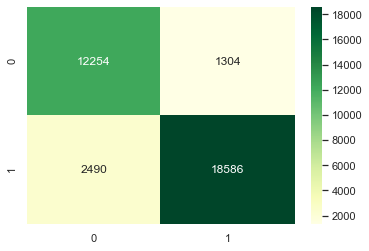

In [336]:
# Print confusion matrix
sns.heatmap(confusion_matrix(y_test, y_test_predicted), annot=True, cmap='YlGn', fmt='d');

In [337]:
from pandas_profiling import ProfileReport

In [338]:
profile = ProfileReport(df, title="Pandas Profiling Report", explorative = True)

In [339]:
profile

Summarize dataset:   0%|          | 0/32 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [340]:
df.corr()

,backers_count,converted_pledged_amount,created_at,deadline,disable_communication,goal,is_starrable,launched_at,pledged,staff_pick,state_changed_at,usd_pledged,Goal_USD
backers_count,1.000000,0.789663,0.028706,0.034670,NaN,0.012146,NaN,0.034500,0.247104,0.157386,0.034671,0.789534,0.007130
converted_pledged_amount,0.789663,1.000000,0.036229,0.042017,NaN,0.011737,NaN,0.041562,0.309476,0.145768,0.042017,0.999973,0.007747
created_at,0.028706,0.036229,1.000000,0.983346,NaN,0.004345,NaN,0.983563,0.029992,-0.041341,0.983346,0.036286,-0.001011
deadline,0.034670,0.042017,0.983346,1.000000,NaN,0.005097,NaN,0.999870,0.031772,-0.032871,1.000000,0.042083,-0.000329
disable_communication,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
goal,0.012146,0.011737,0.004345,0.005097,NaN,1.000000,NaN,0.004594,0.148242,-0.003677,0.005097,0.011841,0.945796
is_starrable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
launched_at,0.034500,0.041562,0.983563,0.999870,NaN,0.004594,NaN,1.000000,0.031529,-0.032528,0.999870,0.041628,-0.000750
pledged,0.247104,0.309476,0.029992,0.031772,NaN,0.148242,NaN,0.031529,1.000000,0.062315,0.031772,0.309887,0.002988
staff_pick,0.157386,0.145768,-0.041341,-0.032871,NaN,-0.003677,NaN,-0.032528,0.062315,1.000000,-0.032871,0.145718,-0.006220
